In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [9]:
import numpy as np
import tensorflow as tf
import keras 
from keras.layers import Dense, Conv2D, MaxPool2D, UpSampling2D, Dropout, Input
from tensorflow.keras.utils import img_to_array
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm 
import os
import re
#importing all the nessescary libraries

In [ ]:
 #dataset consist of 188 image and their corresponding sketches.
 # to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)


# defining the size of image 
SIZE = 256

image_path = '/content/gdrive/MyDrive/photos'
img_array = []

sketch_path = '/content/gdrive/MyDrive/sketches'
sketch_array = []

image_file = sorted_alphanumeric(os.listdir(image_path))
sketch_file = sorted_alphanumeric(os.listdir(sketch_path))


for i in tqdm(image_file):
    image = cv2.imread(image_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    
    #appending normal normal image    
    img_array.append(img_to_array(image))
    # Image Augmentation
    
    # horizontal flip 
    img1 = cv2.flip(image,1)
    img_array.append(img_to_array(img1))
     #vertical flip 
    img2 = cv2.flip(image,-1)
    img_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    img_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    img_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    img_array.append(img_to_array(img5))
     # rotate anti clockwise 
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    img_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    img_array.append(img_to_array(img7))
  
    
for i in tqdm(sketch_file):
    image = cv2.imread(sketch_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    # appending normal sketch image
    sketch_array.append(img_to_array(image))
    
    #Image Augmentation
    # horizontal flip 
    img1 = cv2.flip(image,1)
    sketch_array.append(img_to_array(img1))
     #vertical flip 
    img2 = cv2.flip(image,-1)
    sketch_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    sketch_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    sketch_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    sketch_array.append(img_to_array(img5))
     # rotate anti clockwise 
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    sketch_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    sketch_array.append(img_to_array(img7))

100%|██████████| 188/188 [01:47<00:00,  1.74it/s]


In [ ]:
print("Total number of sketch images:",len(sketch_array))
print("Total number of images:",len(img_array))

Total number of sketch images: 1504
Total number of images: 1504


In [ ]:
def plot_images(image, sketches):
    plt.figure(figsize=(7,7))
    plt.subplot(1,2,1)
    plt.title('Image', color = 'green', fontsize = 20)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.title('Sketches ', color = 'black', fontsize = 20)
    plt.imshow(sketches)
   
    plt.show()

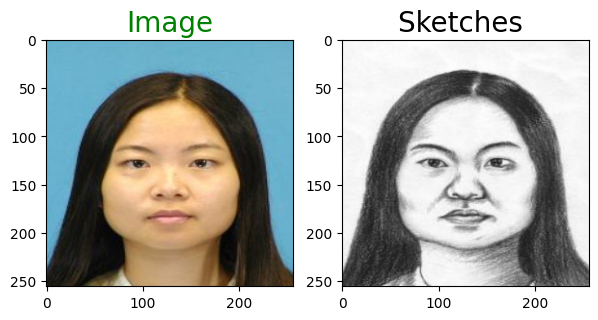

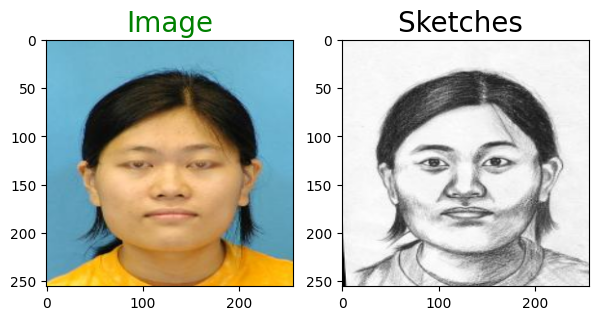

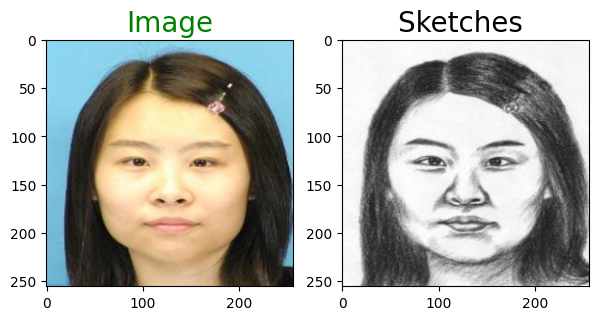

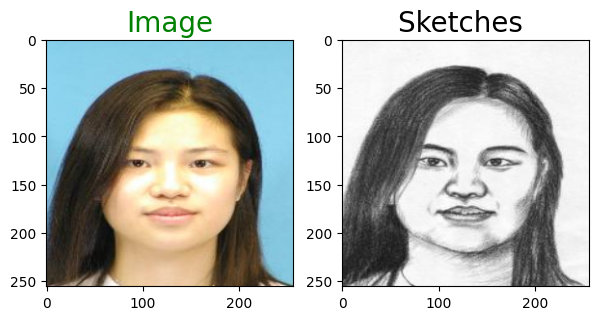

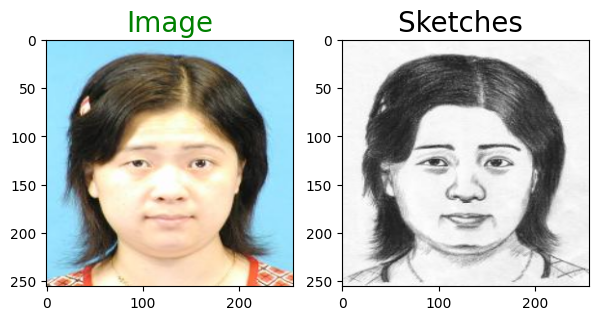

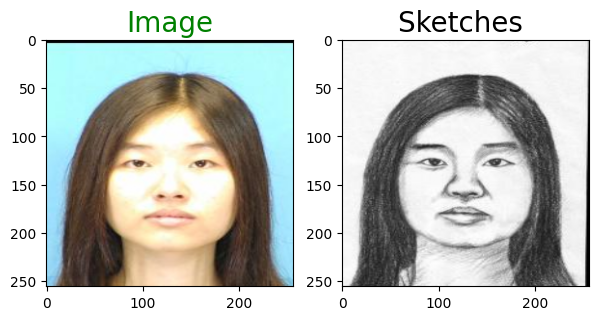

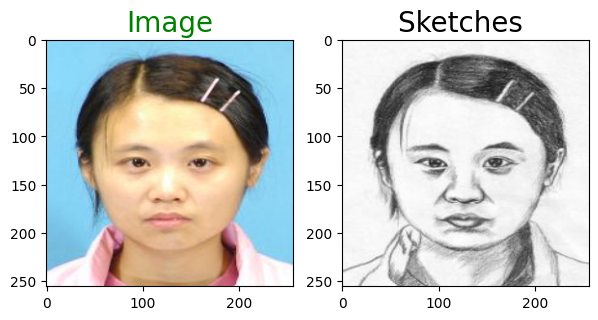

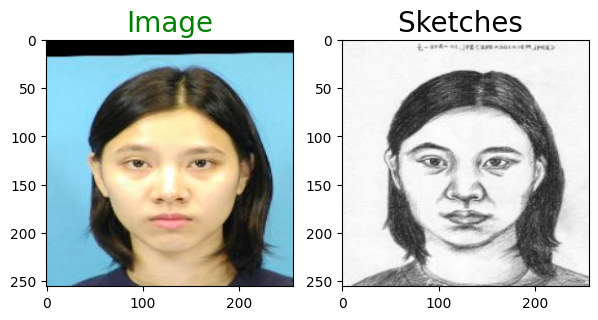

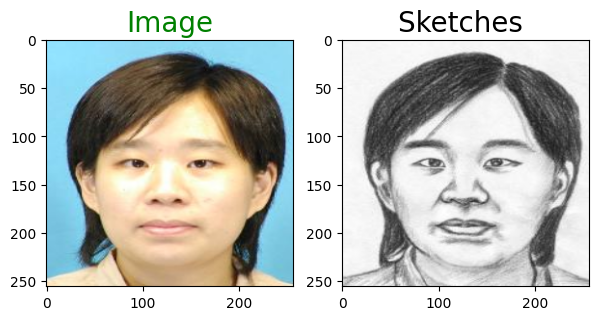

In [ ]:
ls = [i for i in range(0,65,8)]
for i in ls:
    plot_images(img_array[i],sketch_array[i])

In [ ]:
train_sketch_image = sketch_array[:1400]
train_image = img_array[:1400]
test_sketch_image = sketch_array[1400:]
test_image = img_array[1400:]
# reshaping
train_sketch_image = np.reshape(train_sketch_image,(len(train_sketch_image),SIZE,SIZE,3))
train_image = np.reshape(train_image, (len(train_image),SIZE,SIZE,3))
print('Train color image shape:',train_image.shape)
test_sketch_image = np.reshape(test_sketch_image,(len(test_sketch_image),SIZE,SIZE,3))
test_image = np.reshape(test_image, (len(test_image),SIZE,SIZE,3))
print('Test color image shape',test_image.shape)

Train color image shape: (1400, 256, 256, 3)
Test color image shape (104, 256, 256, 3)


In [ ]:
def downsample(filters, size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(keras.layers.Conv2D(filters = filters, kernel_size = size, strides = 2, use_bias = False, kernel_initializer = 'he_normal'))
    if apply_batch_normalization:
        downsample.add(keras.layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample

In [ ]:
def upsample(filters, size, apply_dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(keras.layers.Conv2DTranspose(filters = filters, kernel_size = size, strides = 2, use_bias = False, kernel_initializer = 'he_normal'))
    if apply_dropout:
        upsample.add(tf.keras.layers.Dropout(0.1))    
    upsample.add(tf.keras.layers.LeakyReLU()) 
    return upsample

In [ ]:
def model():
    encoder_input = keras.Input(shape = (SIZE, SIZE, 3))
    x = downsample(16, 4, False)(encoder_input)
    x = downsample(32,4)(x)
    x = downsample(64,4,False)(x)
    x = downsample(128,4)(x)
    x = downsample(256,4)(x)
   
    encoder_output = downsample(512,4)(x)
    
    decoder_input = upsample(512,4,True)(encoder_output)
    
    x = upsample(256,4,False)(decoder_input)
    x = upsample(128,4, True)(x)
    x = upsample(64,4)(x)
    x = upsample(32,4)(x)
    x = upsample(16,4)(x)
    x = tf.keras.layers.Conv2DTranspose(8,(2,2),strides = (1,1), padding = 'valid')(x)
    decoder_output = tf.keras.layers.Conv2DTranspose(3,(2,2),strides = (1,1), padding = 'valid')(x)
    
  
    return tf.keras.Model(encoder_input, decoder_output)

In [ ]:
# to get summary of model
model = model()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 127, 127, 16)      768       
                                                                 
 sequential_1 (Sequential)   (None, 62, 62, 32)        8320      
                                                                 
 sequential_2 (Sequential)   (None, 30, 30, 64)        32768     
                                                                 
 sequential_3 (Sequential)   (None, 14, 14, 128)       131584    
                                                                 
 sequential_4 (Sequential)   (None, 6, 6, 256)         525312    
                                                                 
 sequential_5 (Sequential)   (None, 2, 2, 512)         209920

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

model.fit(train_sketch_image, train_image, epochs = 700, verbose = 1)

Epoch 1/700
44/44 [==============================] - 26s 175ms/step - loss: 0.2823 - acc: 0.3150
Epoch 2/700
44/44 [==============================] - 6s 135ms/step - loss: 0.1530 - acc: 0.6842
Epoch 3/700
44/44 [==============================] - 6s 133ms/step - loss: 0.1321 - acc: 0.7928
Epoch 4/700
44/44 [==============================] - 6s 137ms/step - loss: 0.1205 - acc: 0.8218
Epoch 5/700
44/44 [==============================] - 6s 134ms/step - loss: 0.1109 - acc: 0.8394
Epoch 6/700
44/44 [==============================] - 6s 137ms/step - loss: 0.1063 - acc: 0.8499
Epoch 7/700
44/44 [==============================] - 6s 138ms/step - loss: 0.1027 - acc: 0.8578
Epoch 8/700
44/44 [==============================] - 6s 136ms/step - loss: 0.1000 - acc: 0.8613
Epoch 9/700
44/44 [==============================] - 6s 140ms/step - loss: 0.1007 - acc: 0.8618
Epoch 10/700
44/44 [==============================] - 6s 137ms/step - loss: 0.0933 - acc: 0.8653
Epoch 11/700
44/44 [==================

In [ ]:
prediction_on_test_data = model.evaluate(test_sketch_image,test_image)
print("Loss: ", prediction_on_test_data[0])
print("Accuracy: ", np.round(prediction_on_test_data[1] * 100,1))

4/4 [==============================] - 1s 205ms/step - loss: 0.0756 - acc: 0.9007
Loss:  0.0755966380238533
Accuracy:  90.1


In [ ]:
def show_images(real,sketch, predicted):
    plt.figure(figsize = (12,12))
    plt.subplot(1,3,1)
    plt.title("Image",fontsize = 15, color = 'Lime')
    plt.imshow(real)
    plt.subplot(1,3,2)
    plt.title("sketch",fontsize = 15, color = 'Blue')
    plt.imshow(sketch)
    plt.subplot(1,3,3)
    plt.title("Predicted",fontsize = 15, color = 'gold')
    plt.imshow(predicted)

1/1 [==============================] - 0s 38ms/step


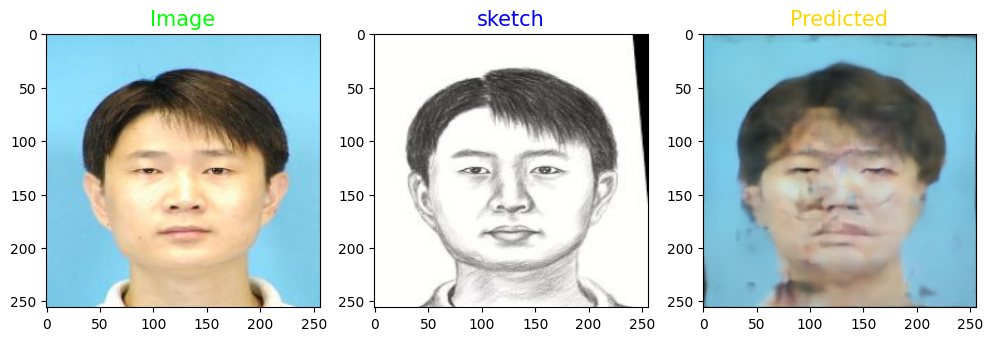

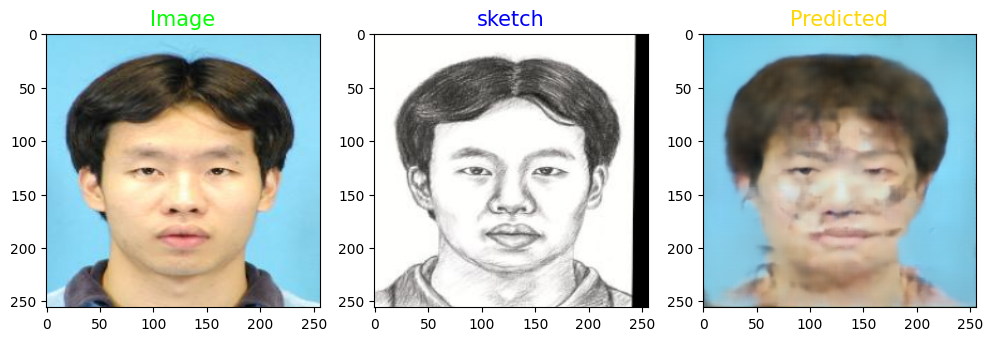

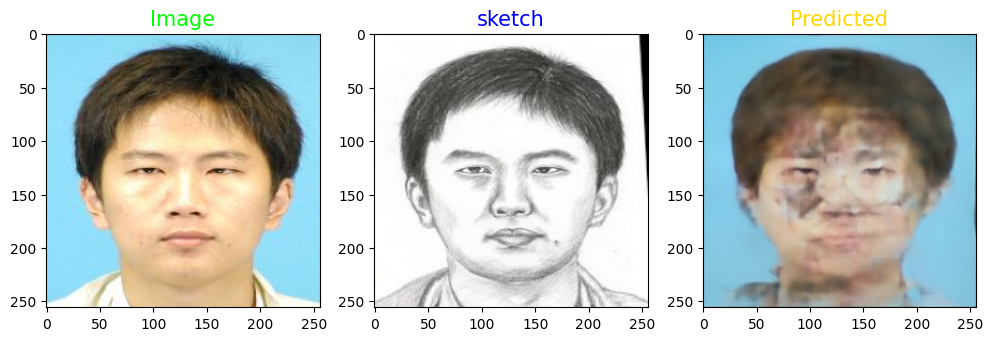

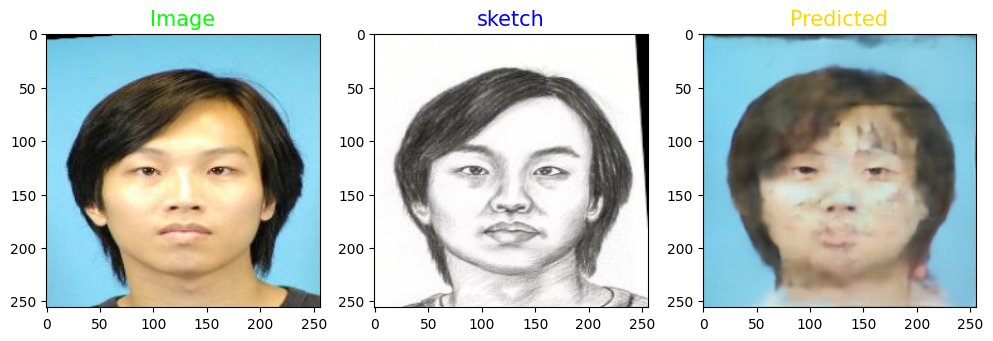

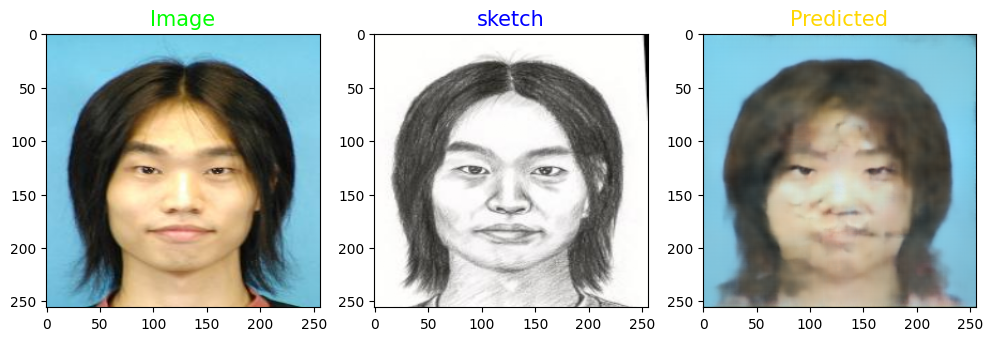

...

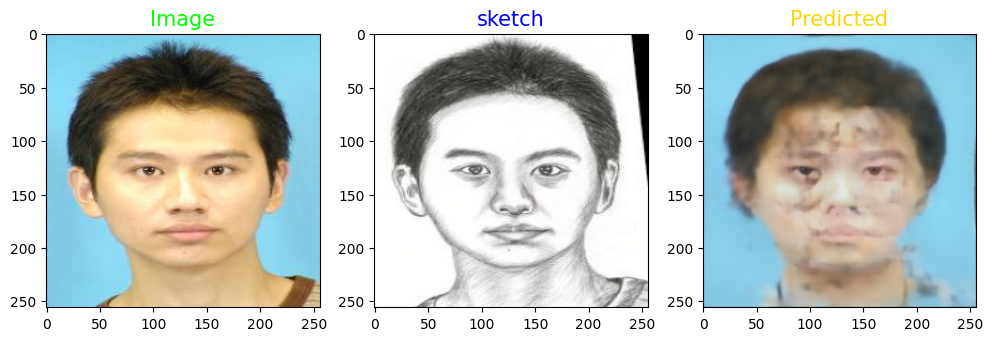

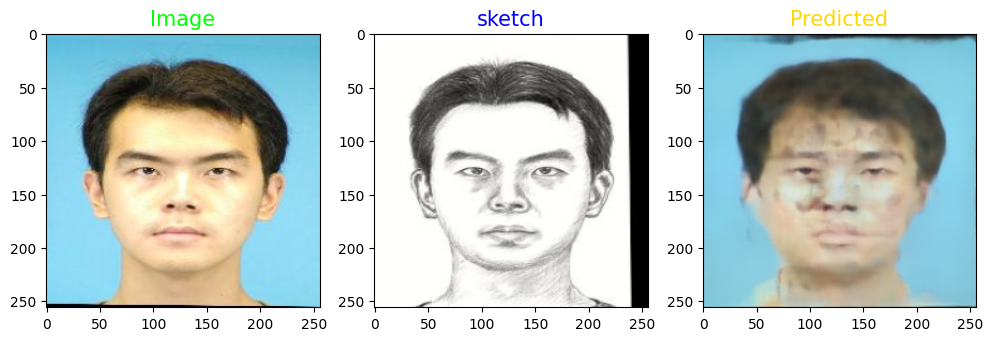

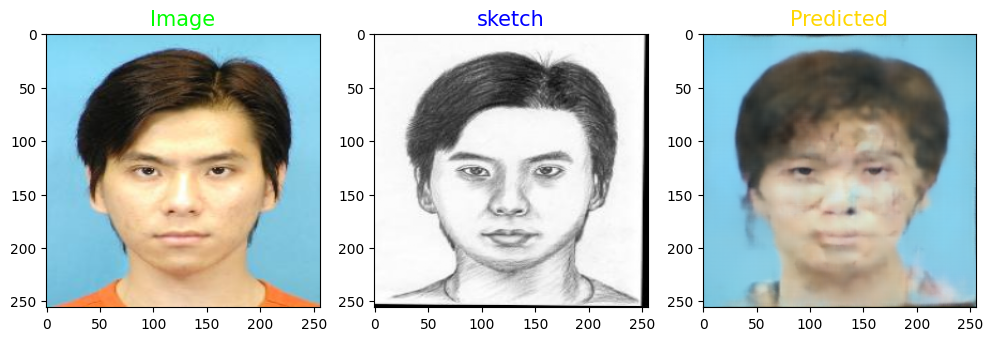

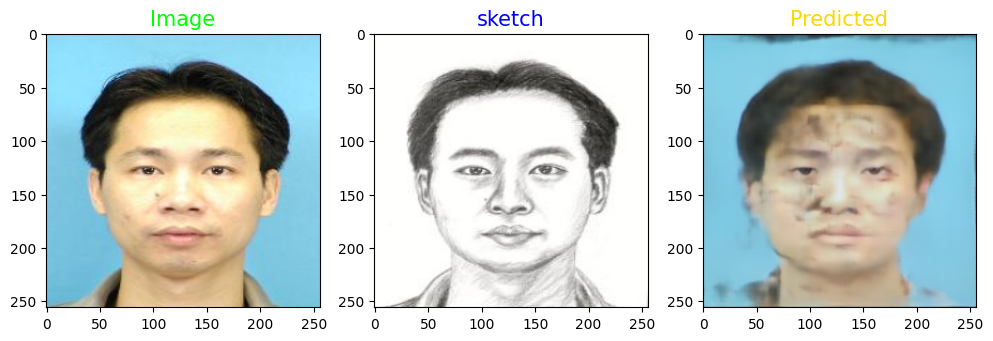

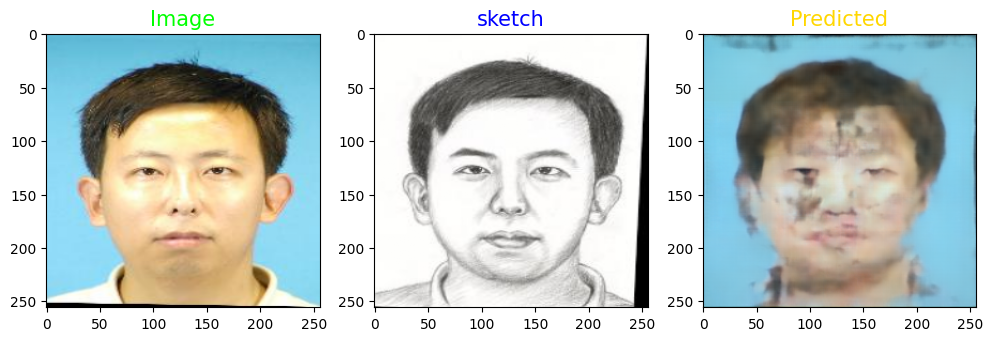

In [ ]:
ls = [i for i in range(0,95,8)]
for i in ls:
    predicted =np.clip(model.predict(test_image[i].reshape(1,SIZE,SIZE,3)),0.0,1.0).reshape(SIZE,SIZE,3)
    show_images(test_image[i],test_sketch_image[i],predicted)

In [ ]:
# for an image to be generated properly normalizing is important, learnt based on trial and error method. 

In [45]:
ind_tar_img=cv2.imread('/content/gdrive/MyDrive/sas_face_img.jpg')
ind_tar_im2 = cv2.resize(ind_tar_img, (SIZE, SIZE))
ind_tar_im2=cv2.cvtColor(ind_tar_im2, cv2.COLOR_BGR2RGB)
ind_tar_im2 = ind_tar_im2.astype('float32') / 255.0

ind_sketch=cv2.imread('/content/gdrive/MyDrive/sas_face_sketch.jpg')
ind_sketch2=cv2.resize(ind_sketch,(SIZE,SIZE))
ind_sketch2=cv2.cvtColor(ind_sketch2,cv2.COLOR_BGR2RGB)
ind_sketch2 = ind_sketch2.astype('float32') / 255.0

1/1 [==============================] - 0s 113ms/step


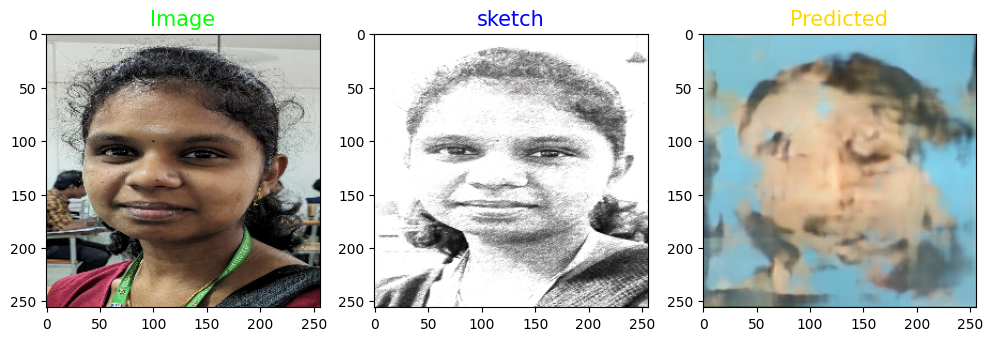

In [46]:
predicted =np.clip(model_loaded.predict(ind_sketch2.reshape(1,SIZE,SIZE,3)),0.0,1.0).reshape(SIZE,SIZE,3)
show_images(ind_tar_im2,ind_sketch2,predicted)

In [ ]:
model.save('sketch_face_700.h5')

In [23]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import cv2 
SIZE=256
from tensorflow import keras 
model_loaded=keras.models.load_model('/content/gdrive/MyDrive/sketch_face_700.h5')

In [20]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

In [25]:
real_image = '/content/gdrive/MyDrive/Real-time/photos'
real_image_array = []

real_sketch = '/content/gdrive/MyDrive/Real-time/sketch'
real_sketch_array = []

real_image_file = sorted_alphanumeric(os.listdir(real_image))
real_sketch_file = sorted_alphanumeric(os.listdir(real_sketch))


for i in tqdm(real_image_file):
    image1 = cv2.imread(real_image + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    real_image_array.append(img_to_array(image))

for i in tqdm(real_sketch_file):
    sketch1 = cv2.imread(real_sketch + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    sketch = cv2.cvtColor(sketch1, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    sketch = cv2.resize(sketch, (SIZE, SIZE))
    
    # normalizing image 
    sketch = sketch.astype('float32') / 255.0
    # appending normal sketch image
    real_sketch_array.append(img_to_array(sketch))

100%|██████████| 8/8 [00:00<00:00, 44.04it/s]


In [26]:
print("Total number of sketch images:",len(real_sketch_array))
print("Total number of images:",len(real_image_array))

Total number of sketch images: 8
Total number of images: 8


In [31]:
real_image_array[1].shape

(256, 256, 3)

In [32]:
real_sketch_image = np.reshape(real_sketch_array,(len(real_sketch_array),SIZE,SIZE,3))
real_image = np.reshape(real_image_array, (len(real_image_array),SIZE,SIZE,3))

In [33]:
prediction_on_real_data = model_loaded.evaluate(real_sketch_image,real_image)
print("Loss: ", prediction_on_real_data[0])
print("Accuracy: ", np.round(prediction_on_real_data[1] * 100,1))

1/1 [==============================] - 1s 1s/step - loss: 0.2501 - acc: 0.3731
Loss:  0.25012198090553284
Accuracy:  37.3


In [34]:
def show_images(real,sketch, predicted):
    plt.figure(figsize = (12,12))
    plt.subplot(1,3,1)
    plt.title("Image",fontsize = 15, color = 'Lime')
    plt.imshow(real)
    plt.subplot(1,3,2)
    plt.title("sketch",fontsize = 15, color = 'Blue')
    plt.imshow(sketch)
    plt.subplot(1,3,3)
    plt.title("Predicted",fontsize = 15, color = 'gold')
    plt.imshow(predicted)

1/1 [==============================] - 0s 188ms/step


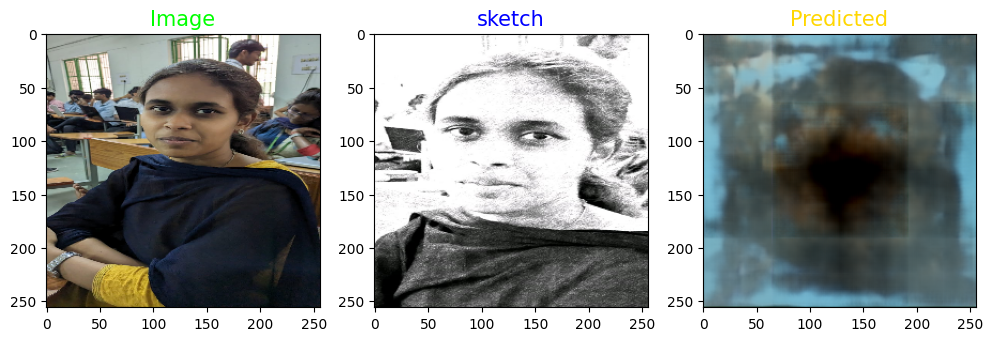

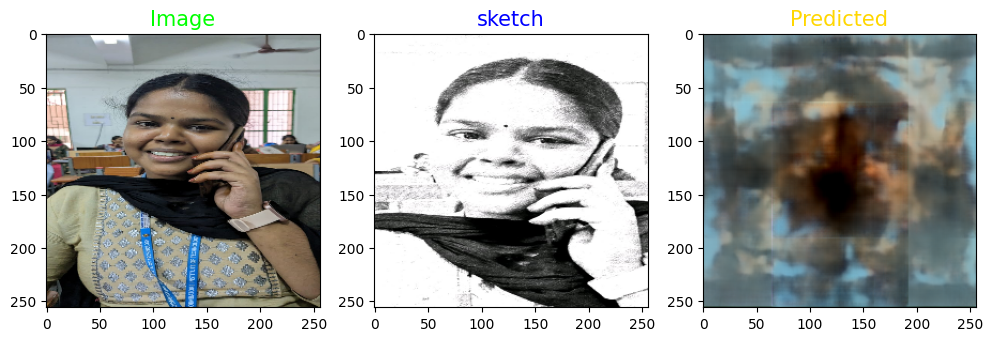

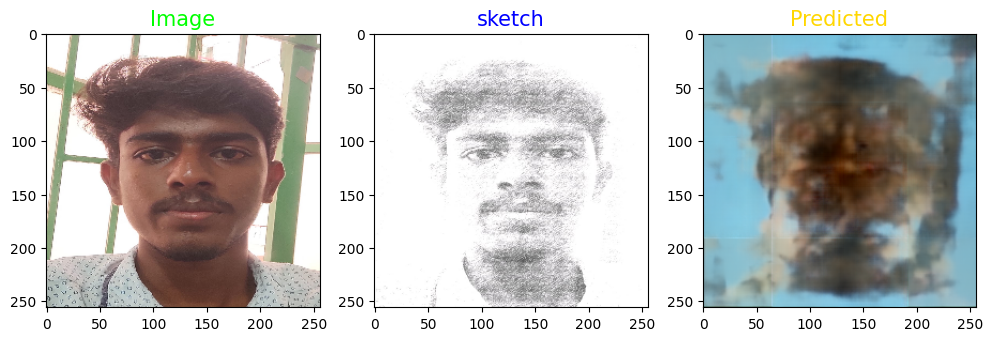

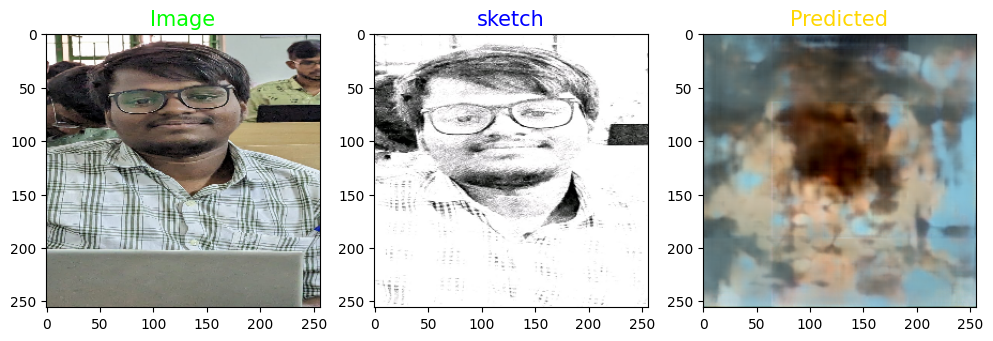

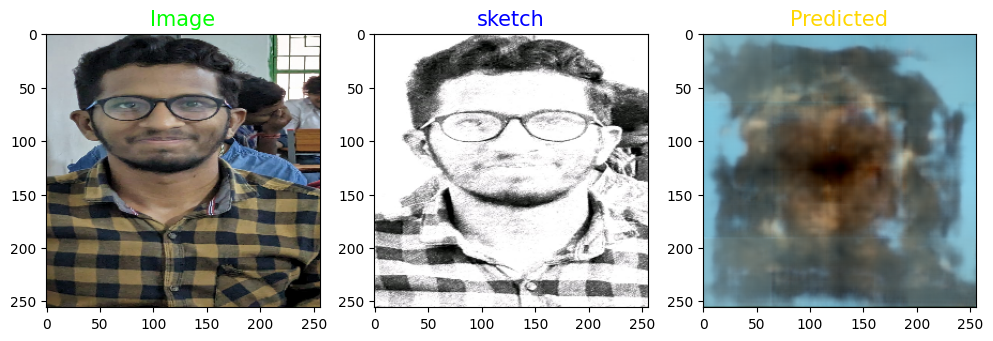

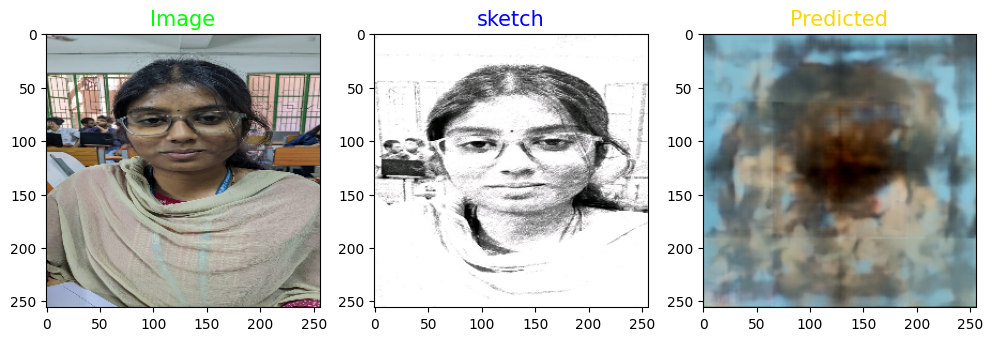

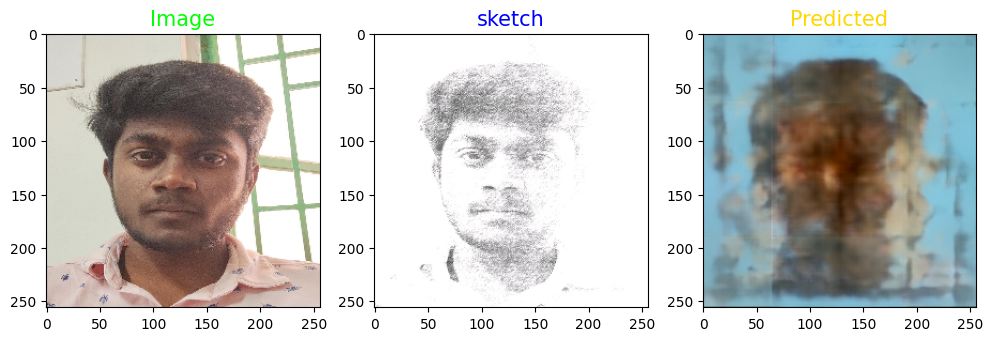

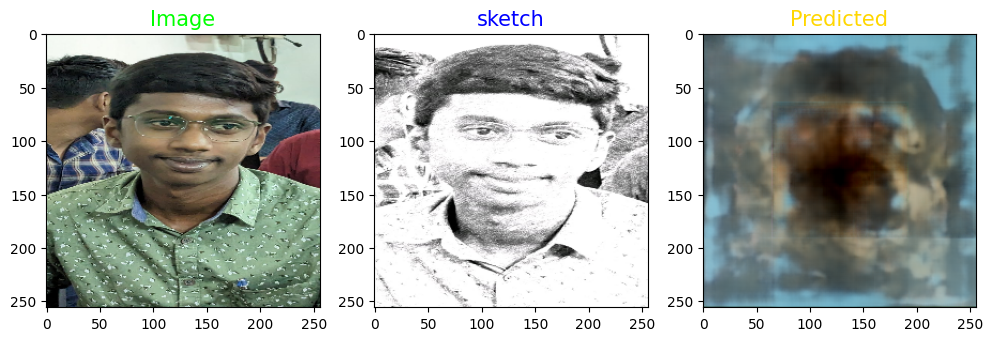

In [40]:
ls = [i for i in range(8)]
for i in ls:
    predictions_on_real =np.clip(model_loaded.predict(real_image[i].reshape(1,SIZE,SIZE,3)),0.0,1.0).reshape(SIZE,SIZE,3)
    show_images(real_image[i],real_sketch_image[i],predictions_on_real)